<a href="https://colab.research.google.com/github/we-make-ai/welcome2ki-3/blob/main/06_Data_Augmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install fastai --upgrade -q
!pip install nbdev

     |████████████████████████████████| 194kB 11.6MB/s 
     |████████████████████████████████| 51kB 6.5MB/s 
     |████████████████████████████████| 51kB 5.9MB/s 


In [ ]:
from fastai.vision.all import *

# Dataloaders und Learners erstellen

## Download der Bilddateien von GDrive

In [ ]:
!cp /content/drive/My\ Drive/saab_images/saab_images.tar.gz ./
!mkdir /content/images/
!tar -xf /content/saab_images.tar.gz -C /content/images/

In [ ]:
path = Path('images')
failed = verify_images(get_image_files(path))
failed.map(Path.unlink);

## Dataloader Objekt erstellen

In [ ]:
cars = DataBlock(
  blocks=(ImageBlock, CategoryBlock), 
  get_items=get_image_files, 
  splitter=RandomSplitter(valid_pct=0.2, seed=42),
  get_y=parent_label,
  item_tfms=Resize(128))

In [ ]:
dls = cars.dataloaders(path)

## Resizing

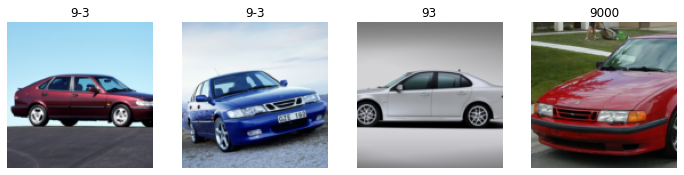

In [ ]:
dls.show_batch(max_n=4, nrows=1)

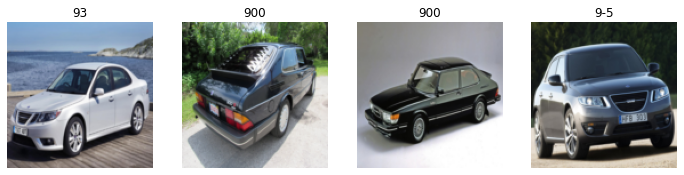

In [ ]:
cars = cars.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = cars.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

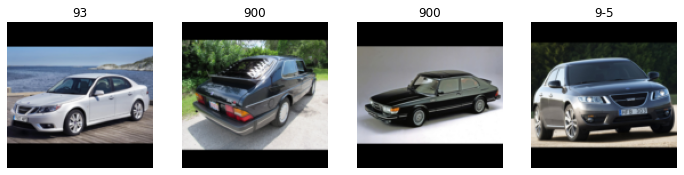

In [ ]:
cars = cars.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = cars.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

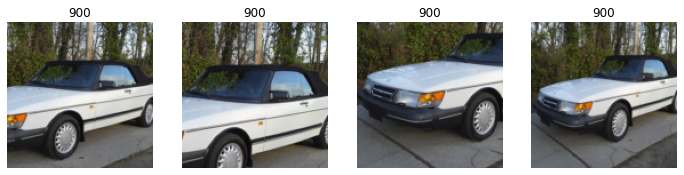

In [ ]:
cars = cars.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = cars.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)


## Data Augmentation

In [ ]:
doc(aug_transforms)

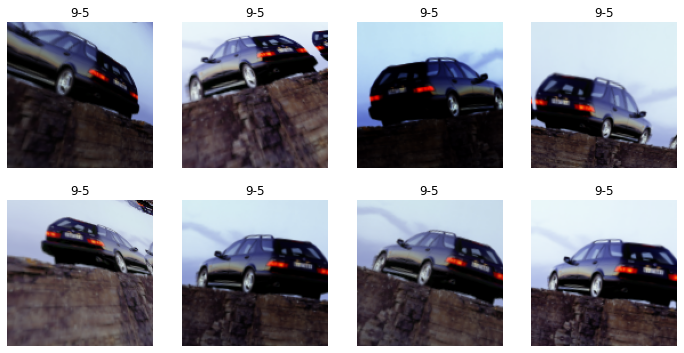

In [ ]:
cars = cars.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = cars.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

## Trainieren des Learner

In [ ]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


epoch,train_loss,valid_loss,error_rate,time
0,2.753187,2.105712,0.689655,00:22


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


epoch,train_loss,valid_loss,error_rate,time
0,2.363589,1.611831,0.572414,00:22
1,2.193249,1.482387,0.544828,00:22
2,2.053517,1.441324,0.510345,00:23
3,1.949242,1.418522,0.503448,00:22


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


## Learner exportieren

In [ ]:
learn.export('saab_cars_classifier.pkl')

In [ ]:
learn.export()

In [ ]:
path = Path()
path.ls(file_exts='.pkl')

(#2) [Path('saab_cars_classifier.pkl'),Path('export.pkl')]

In [ ]:
# store learner on gdrive
!cp /content/saab_cars_classifier.pkl /content/drive/My\ Drive/saab_images/saab_cars_classifier.pkl

## Learner importieren / Inference

In [ ]:
# copy exported learner from gdrive
!cp /content/drive/My\ Drive/saab_images/saab_cars_classifier.pkl ./

In [ ]:
inference = load_learner(path/'saab_cars_classifier.pkl')

In [ ]:
doc(load_learner)

In [ ]:
!cp /content/saab9000.jpg /content/drive/My\ Drive/saab_images/
!cp /content/drive/My\ Drive/saab_images/saab9000.jpg ./

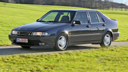

In [ ]:
img = Image.open('saab9000.jpg')
img.to_thumb(128, 128)

In [ ]:
inference.predict('saab9000.jpg')

('9000', tensor(3), tensor([0.0148, 0.0683, 0.2861, 0.6053, 0.0255]))

In [ ]:
inference.dls.vocab

['9-3', '9-5', '900', '9000', '93']

In [ ]:
inference.dls.vocab[3]

'9000'

## Confusion Matrix

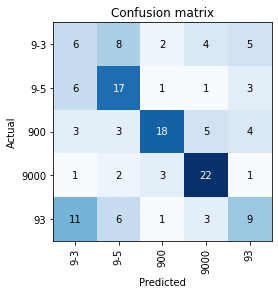

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

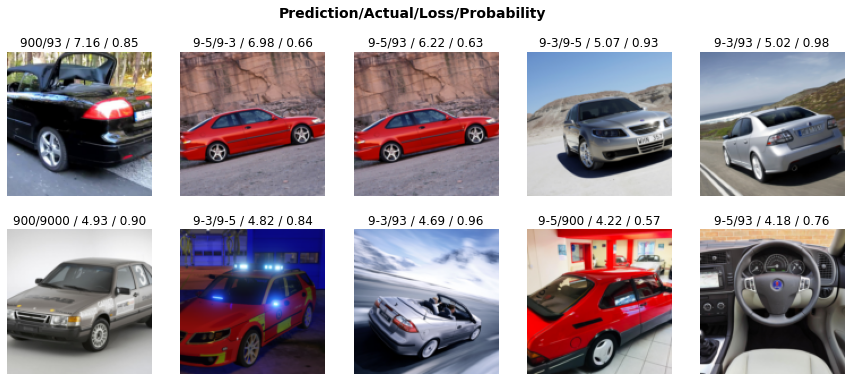

In [ ]:
interp.plot_top_losses(10, nrows=2)

In [ ]:
from fastai.vision.widgets import *
cleaner = ImageClassifierCleaner(learn)
cleaner

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


In [ ]:
for idx in cleaner.delete():
  cleaner.fns[idx].unlink()

In [ ]:
for idx,cat in cleaner.change():
  shutil.move(str(cleaner.fns[idx]), path/cat)